# Resnet18 - Thiago Garbin

### Comparação de algoritmos de aprendizado não supervisionado em features de imagens

In [67]:
# Para evitar divergência de resultados no random_state ao executar, é preciso ter a última versão do scikit-learn (0.24.2)

In [66]:
import pandas as pd
import numpy as np
import sklearn

from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors

from scipy.cluster.hierarchy import dendrogram

from sklearn.metrics import accuracy_score
from sklearn.metrics.cluster import completeness_score
from sklearn.metrics import adjusted_rand_score
from sklearn.metrics import silhouette_score
from sklearn.metrics import silhouette_samples

from sklearn.decomposition import PCA

import matplotlib.pyplot as plt
import matplotlib.cm as cm

from PIL import Image
import PIL

In [2]:
df = pd.DataFrame()

In [3]:
df['Path'] = np.load('trabalho_II_data/paths.npy')
df['Class'] = np.load('trabalho_II_data/labels.npy')

In [4]:
df.head()
# df.sample(20)
# df.shape

,Path,Class
0,natural_images_100\airplane\airplane_0016.jpg,0
1,natural_images_100\airplane\airplane_0029.jpg,0
2,natural_images_100\airplane\airplane_0030.jpg,0
3,natural_images_100\airplane\airplane_0038.jpg,0
4,natural_images_100\airplane\airplane_0047.jpg,0


In [5]:
Resnet18 = np.load('trabalho_II_data/resnet18_features.npy')
df_aux = pd.DataFrame(Resnet18)

In [6]:
df_aux.shape

(800, 512)

In [7]:
result = pd.concat([df, df_aux], axis=1)

In [8]:
result.head()

,Path,Class,0,1,2,3,4,5,6,7,...,502,503,504,505,506,507,508,509,510,511
0,natural_images_100\airplane\airplane_0016.jpg,0,0.279517,0.921571,0.425109,0.721348,1.196174,0.100233,0.115628,3.688635,...,1.578029,0.669585,0.619507,0.008830,0.252418,2.773906,2.240245,0.081213,2.650404,2.051053
1,natural_images_100\airplane\airplane_0029.jpg,0,0.127191,1.373092,1.468813,0.506954,1.554558,0.449629,0.851521,0.924772,...,0.705396,0.907880,0.257159,0.085557,0.053820,3.398434,1.043557,0.785981,0.864995,1.218548
2,natural_images_100\airplane\airplane_0030.jpg,0,0.639940,1.978143,0.358424,0.117458,0.257801,0.974062,2.608844,0.611253,...,1.232421,0.935696,0.176550,1.311729,0.111655,2.211372,2.026821,1.892206,0.279241,2.117520
3,natural_images_100\airplane\airplane_0038.jpg,0,0.184793,0.661177,0.379288,1.352363,2.567445,0.819255,1.242389,0.555367,...,1.895558,0.833810,1.229328,0.531095,0.684697,2.234543,1.104478,0.807221,0.461888,2.190336
4,natural_images_100\airplane\airplane_0047.jpg,0,0.105610,1.997057,0.173069,0.661821,2.172424,0.242125,1.108709,2.502481,...,1.681485,0.543897,0.410002,0.369608,0.079944,2.664208,1.227262,0.700057,0.543840,0.904311


In [9]:
df_train = result.drop(columns=['Path', 'Class'])

In [10]:
df_labels = result['Class']

In [11]:
# df_train.head()
# df_labels.head()

classes = ['airplane', 'car', 'cat', 'dog', 'flower', 'fruit', 'motorbike', 'person']

### 1 - K-Means

In [12]:
# Método elbow com configuração padrão do k-means para confirmar que o número ideal de clusters é 8,
# baseado na inércia

clusters_range = range(1, int(np.sqrt(len(df_train))) + 1)

inertias = []
for k in clusters_range:
    
    model_k_m = KMeans(n_clusters=k)
    model_k_m.fit(df_train)
    
    inertias.append(model_k_m.inertia_)

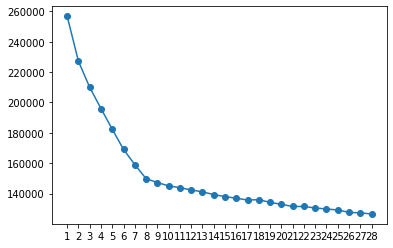

In [13]:
plt.plot(clusters_range, inertias, '-o')
plt.xticks(clusters_range)
plt.show()

In [14]:
# K-Means com k=8, o mesmo número dos ground truth, e dois diferentes modos de inicialização

state = 35

k = 8

model_k_m = KMeans(n_clusters=k, random_state=state)
model_k_m.fit(df_train)

model_k_a = KMeans(n_clusters=k, init='random', random_state=state)
model_k_a.fit(df_train)

KMeans(init='random', random_state=35)

In [15]:
print('Índices externos')

ars = adjusted_rand_score(model_k_m.labels_, df_labels)
comp = completeness_score(model_k_m.labels_, df_labels)
print('\nInicialização K-Means++\nAdjusted Rand Index: {:.4f}\nCompleteness Score: {:.4f}'.format(ars, comp))

ars = adjusted_rand_score(model_k_a.labels_, df_labels)
comp = completeness_score(model_k_a.labels_, df_labels)
print('\nInicialização Random\nAdjusted Rand Index: {:.4f}\nCompleteness Score: {:.4f}'.format(ars, comp))

Índices externos

Inicialização K-Means++
Adjusted Rand Index: 0.9886
Completeness Score: 0.9874

Inicialização Random
Adjusted Rand Index: 0.9777
Completeness Score: 0.9811


In [16]:
def plot_silhouette(data, model, nome_modelo):
    """
    Method from Scikit-learn with some changes.
    Source: https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html
    """
    k = model.n_clusters
    cluster_labels = model.labels_
    X = data.values
        
    fig, ax = plt.subplots()
    fig.set_size_inches(8, 6)
    
    ax.set_xlim([-0.1, 1])

    ax.set_ylim([0, len(X) + (k + 1) * 10])

    silhouette_avg = silhouette_score(X, cluster_labels)
    print('Para n_clusters =', k,
          'o Silhouette Score médio é:', silhouette_avg)

    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(k):
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / k)
        ax.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        ax.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        y_lower = y_upper + 10  # 10 for the 0 samples

    ax.set_title('O Silhouette Plot para vários grupos.')
    ax.set_xlabel('Os valores do Silhouette Coefficient')
    ax.set_ylabel('Cluster')

    ax.axvline(x=silhouette_avg, color='red', linestyle='--')

    ax.set_yticks([])  # Clear the yaxis labels / ticks
    ax.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    plt.suptitle('Silhouette Analysis do {} n_clusters = {}'.format(nome_modelo, k),
                 fontsize=14, fontweight='bold')

    plt.show()

Índice interno: Silhueta

Inicialização K-Means++
Para n_clusters = 8 o Silhouette Score médio é: 0.18804918


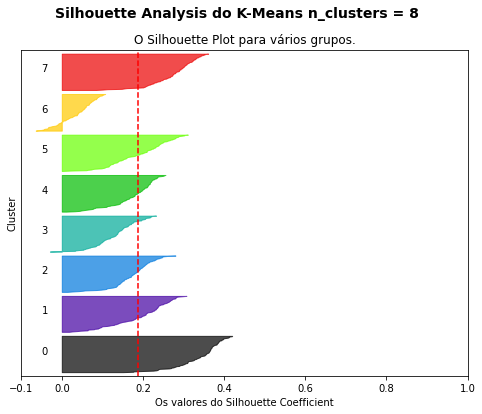


Inicialização Random
Para n_clusters = 8 o Silhouette Score médio é: 0.18782207


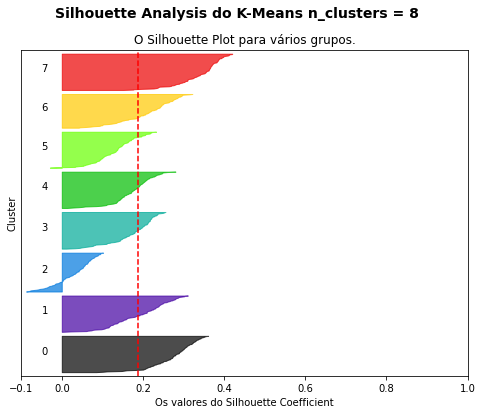

In [17]:
print('Índice interno: Silhueta')

print('\nInicialização K-Means++')
plot_silhouette(df_train, model_k_m, 'K-Means')

print('\nInicialização Random')
plot_silhouette(df_train, model_k_a, 'K-Means')

In [18]:
# Analisando Clusters gerados pelo K-Means com k=8 e inicialização padrão otimizada (k-means++)

print(np.unique(model_k_m.labels_, return_counts=True))

a = 0
for cl in classes:
    print('\nClasse original:', cl)
    print(np.unique(model_k_m.labels_[0+(a*100):100+(a*100)], return_counts=True))
    print(model_k_m.labels_[0+(a*100):100+(a*100)])
    a += 1

(array([0, 1, 2, 3, 4, 5, 6, 7]), array([100,  99, 100,  99, 101, 100, 101, 100], dtype=int64))

Classe original: airplane
(array([5]), array([100], dtype=int64))
[5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5
 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5
 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5]

Classe original: car
(array([7]), array([100], dtype=int64))
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7
 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7
 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]

Classe original: cat
(array([1, 6]), array([98,  2], dtype=int64))
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 6 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 6 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]

Classe original: dog
(array([1, 6]), array([ 1, 99], dtype=int64))
[6 6 6 6 6 6 6 6 6 6 6 6 6 

Gatos agrupados como cachorro:
natural_images_100\cat\cat_0406.jpg Cluster: 6


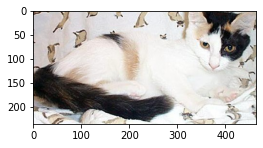

natural_images_100\cat\cat_0586.jpg Cluster: 6


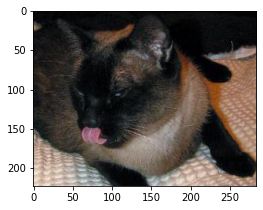


Cachorro agrupado como gato:
natural_images_100\dog\dog_0374.jpg Cluster: 1


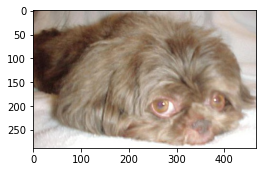


Flor agrupada como fruta:
natural_images_100\flower\flower_0308.jpg Cluster: 4


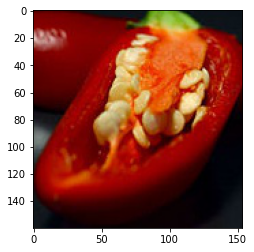

Quanto a esta flor agrupada como fruta, parece ser uma pimenta cortada ao meio, mas que realmente está na pasta das flores


In [19]:
# Mostrando imagens dos objetos atribuídos a clusters que não correspondem a suas classes, inicialização k-means++

plt.rcParams['figure.figsize'] = (4, 4)

print('Gatos agrupados como cachorro:')
for idx, c in enumerate(model_k_m.labels_[200:300]):
    if c != 1:
        print(result.iloc[idx+200]['Path'], 'Cluster:', c)
        image = Image.open(result.iloc[idx+200]['Path'])
        fig, axes = plt.subplots()
        axes.imshow(image)
        plt.show()
        
print('\nCachorro agrupado como gato:')        
for idx, c in enumerate(model_k_m.labels_[300:400]):
    if c != 6:
        print(result.iloc[idx+300]['Path'], 'Cluster:', c)
        image = Image.open(result.iloc[idx+300]['Path'])
        fig, axes = plt.subplots()
        axes.imshow(image)
        plt.show()
        
print('\nFlor agrupada como fruta:')        
for idx, c in enumerate(model_k_m.labels_[400:500]):
    if c != 3:
        print(result.iloc[idx+400]['Path'], 'Cluster:', c)
        image = Image.open(result.iloc[idx+400]['Path'])
        fig, axes = plt.subplots()
        axes.imshow(image)
        plt.show()

print('Quanto a esta flor agrupada como fruta, parece ser uma pimenta cortada ao meio, mas que realmente está \
na pasta das flores')

In [20]:
# Analisando Clusters gerados pelo K-Means com k=8 e inicialização padrão aleatória (random)

a = 0
for cl in classes:
    print('Classe original:', cl)
    print(np.unique(model_k_a.labels_[0+(a*100):100+(a*100)], return_counts=True))
    print(model_k_a.labels_[0+(a*100):100+(a*100)])
    a += 1

Classe original: airplane
(array([1]), array([100], dtype=int64))
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
Classe original: car
(array([0]), array([100], dtype=int64))
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Classe original: cat
(array([2, 6]), array([ 7, 93], dtype=int64))
[6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 2 6 6
 6 6 2 6 6 2 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 2 6 6 6 6 6 6 6 6 6 6 6 6
 6 6 6 6 6 6 6 6 6 6 6 6 6 2 6 2 6 6 6 6 6 6 6 6 6 2]
Classe original: dog
(array([2]), array([100], dtype=int64))
[2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2

Gatos agrupados como cachorro:
natural_images_100\cat\cat_0362.jpg Cluster: 2


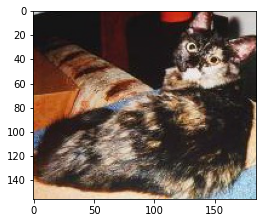

natural_images_100\cat\cat_0406.jpg Cluster: 2


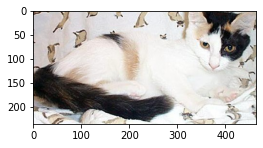

natural_images_100\cat\cat_0440.jpg Cluster: 2


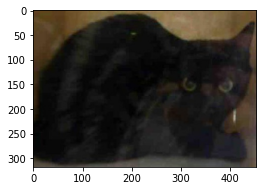

natural_images_100\cat\cat_0586.jpg Cluster: 2


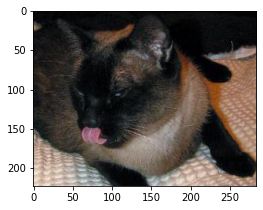

natural_images_100\cat\cat_0788.jpg Cluster: 2


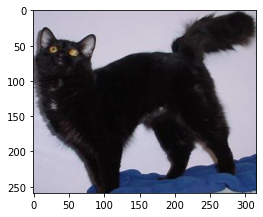

natural_images_100\cat\cat_0793.jpg Cluster: 2


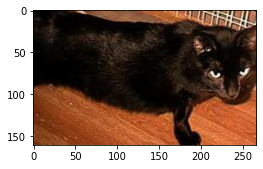

natural_images_100\cat\cat_0877.jpg Cluster: 2


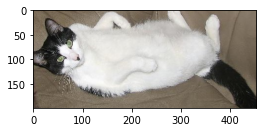


Flor agrupada como fruta:
natural_images_100\flower\flower_0308.jpg Cluster: 3


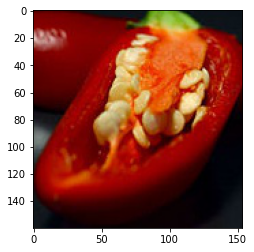

Da mesma forma que ocorreu na inicialização k-means++, a pimenta cortada ao meio que está na pasta das flores foi agrupada como fruta


In [21]:
# Mostrando imagens dos objetos atribuídos a clusters que não correspondem a suas classes, inicialização random

plt.rcParams['figure.figsize'] = (4, 4)

print('Gatos agrupados como cachorro:')
for idx, c in enumerate(model_k_a.labels_[200:300]):
    if c != 6:
        print(result.iloc[idx+200]['Path'], 'Cluster:', c)
        image = Image.open(result.iloc[idx+200]['Path'])
        fig, axes = plt.subplots()
        axes.imshow(image)
        plt.show()
        
print('\nFlor agrupada como fruta:')        
for idx, c in enumerate(model_k_a.labels_[400:500]):
    if c != 5:
        print(result.iloc[idx+400]['Path'], 'Cluster:', c)
        image = Image.open(result.iloc[idx+400]['Path'])
        fig, axes = plt.subplots()
        axes.imshow(image)
        plt.show()
        
print('Da mesma forma que ocorreu na inicialização k-means++, a pimenta cortada ao meio que está na pasta das flores \
foi agrupada como fruta')

In [22]:
# Originalmente temos 8 classes de imagens. Para avaliar o K-Means com as features da Resnet18 e com k=8,
# comparando com os ground truth, utilizou-se como índices externos o adjusted rand index e o completeness score.
# Este último indica se os elementos de uma classe fazem parte de um mesmo cluster, conforme menciona a
# documentação do scikit-learn.

# Assim, de maneira semelhante ao ocorrido na análise com as features do VGG16, consideramdo o modo de inicialização
# padrão (k-means++) e os índices externos, o desempenho do k-means foi bastante satisfatório, com pontuação de 0.9886
# para o adjusted rand index e 0,9874 para o completeness score.
# Analisando visualmente, temos que apenas 4 itens foram atribuídos a clusters errados.
# Mesmo rodando novamente o algoritmo mais algumas vezes com outros valores de random state, estes eram os resultado que
# mais se repetiam.
# Quanto ao índice interno, foi utilizado o silhouette score, obtendo um valor não muito satisfatório de 0,1880, que é
# um pouco mais baixo daquele observado nas features VGG16.

# Já com o modo de inicialização aleatório (random), e utilizando o mesmo valor de random_state=35 utilizado nas
# features do VGG16, foi obtido um desempenho bastante semelhante ao modo de inicialização k-means++ com adjusted
# rand index ficou de 0.9777 e completeness score ficou de 0.9811.
# No que se refere ao silhouette score, este ficou também ficou próximo do visto na inicialização otimizada, com 0,1878. 
# Ressalta-se, entretanto, que ao testar com outros valores de random_state por vezes estas métricas foram
# um tanto menores, com adjusted rand index próximo a 0,80 por exemplo. Ou seja, como era de se esperar,
# o desempenho da inicialização random é mais instável que a inicialização k-means++.


In [23]:
# K-Means com k=4, metade do número de classes originais e inicialização k-means++ pois esta tende a gerar clusters
# mais concisos.

random = 35

k = 4

model_k_m = KMeans(n_clusters=k, random_state=random)
model_k_m.fit(df_train)

KMeans(n_clusters=4, random_state=35)

In [24]:
a = 0
for cl in classes:
    print('Classe original:', cl)
    print(model_k_m.labels_[0+(a*100):100+(a*100)])
    a += 1

Classe original: airplane
[2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 3 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2]
Classe original: car
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
Classe original: cat
[3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3]
Classe original: dog
[3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3]
Classe original: flower
[3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 

In [25]:
# Para k=4 e inicialização otimizada (k-means++) e da mesma forma que foi visto nas features do VGG16,
# nota-se que os aviões tendem a ficar sozinhos em um grupo mesmo rodando o algoritmo diversas vezes.


Classe: airplane


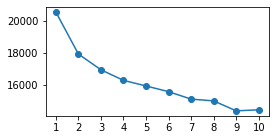

Classe: car


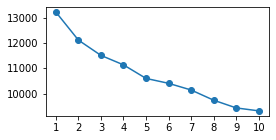

Classe: cat


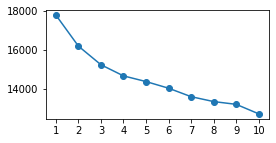

Classe: dog


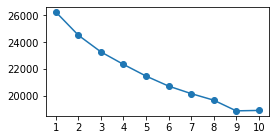

Classe: flower


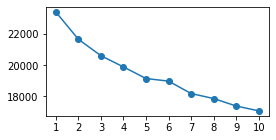

Classe: fruit


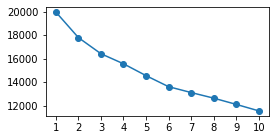

Classe: motorbike


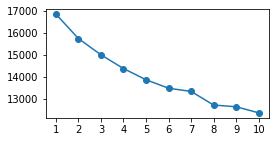

Classe: person


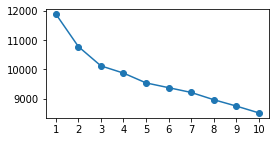

In [26]:
# Analisando para quais classes o K-Means consegue gerar um bom gráfico para o método elbow para
# uma possível geração de subgrupos

plt.rcParams['figure.figsize'] = (4, 2)

for i, cl in enumerate(classes) :
    
    print('Classe:', cl)
    clusters_range = range(1, int(np.sqrt(len(df_train[0+(i*100):100+(i*100)]))) + 1)
    inertias = []  
    for k in clusters_range:

        model_k_m = KMeans(n_clusters=k)
        model_k_m.fit(df_train[0+(i*100):100+(i*100)])

        inertias.append(model_k_m.inertia_)
    
    plt.plot(clusters_range, inertias, '-o')
    plt.xticks(clusters_range)
    plt.show()

car com k=2


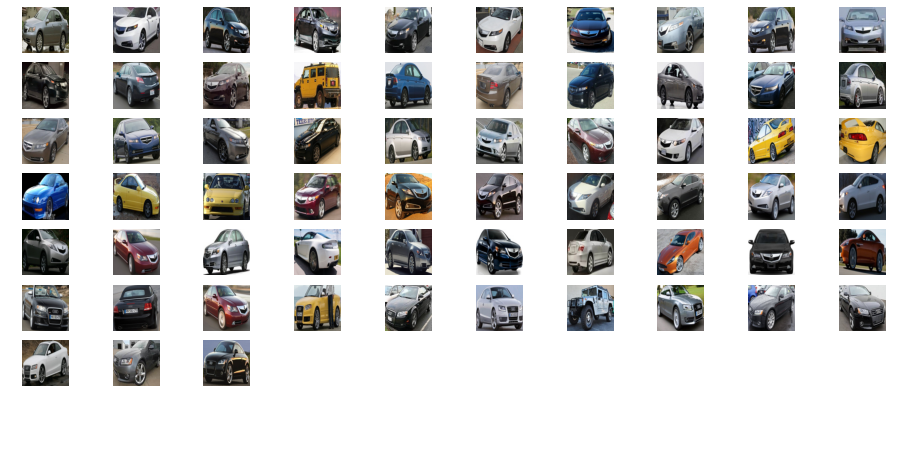

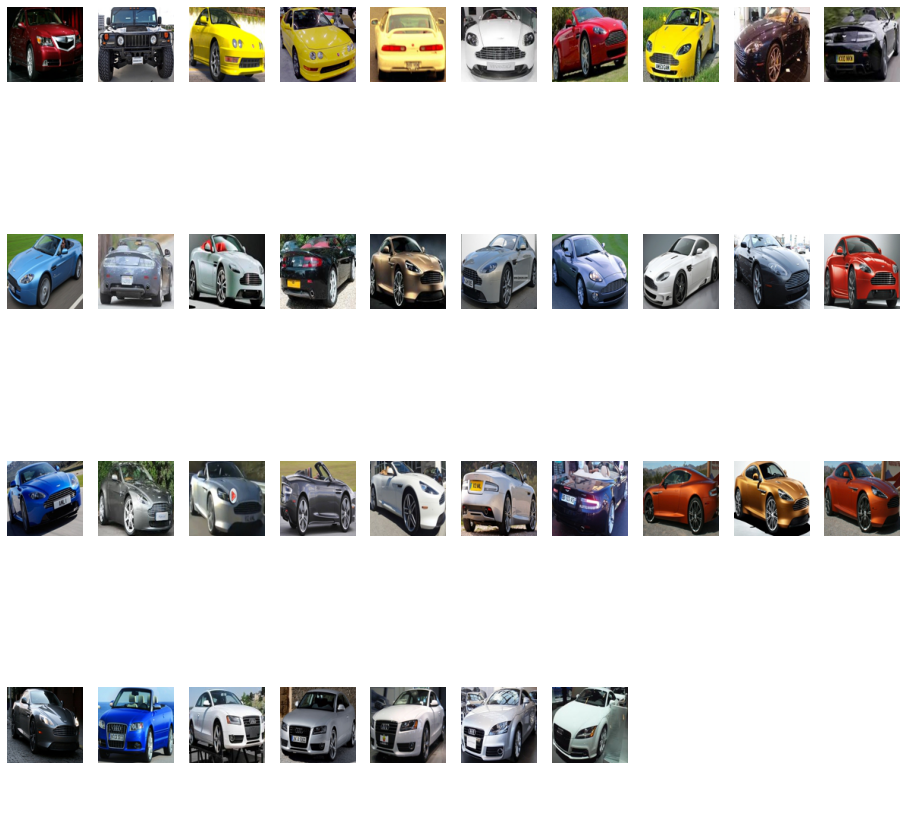

In [27]:
# Assim como visto nas features VGG16, nenhuma classe chega a gerar um bom gráfico elbow e a classe person é a que tem
# os valores mais baixos de inércia. Entretanto, desta vez é possível notar que outra classe gerou valores de
# inércia muito próximos da classe person, que é classe car. Por isso, será analisada a geração de clusters para a classe
# car considerando k=2 e k=10.

print('car com k=2')

plt.rcParams['figure.figsize'] = (16, 8)

k = 2

model_k_m = KMeans(n_clusters=k)
model_k_m.fit(df_train[100:200])

cluster0 = []
cluster1 = []

for idx, c in enumerate(model_k_m.labels_):
    if c == 0:
        cluster0.append(result.iloc[idx+100]['Path'])
    else:
        cluster1.append(result.iloc[idx+100]['Path'])
        
for cl in [cluster0, cluster1]:
    
    ncols = 10
    nrows = int((len(cl)+1)/(ncols-2))
    
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols)
    for i, path in enumerate(cl):
        image = Image.open(path)
        axes.ravel()[i].imshow(image)
    
    [ax.set_axis_off() for ax in axes.ravel()]
    
    plt.rcParams['figure.figsize'] = (16, nrows*2)
    
    plt.show()


In [28]:
# Analisando a classe car para k=2 é possível notar que os carros cupês e conversíveis, em geral, ficaram no segundo
# cluster, enquanto carros sedãs e suv's ficaram no primeiro.

car com k=10


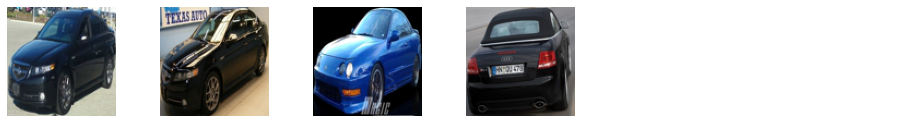

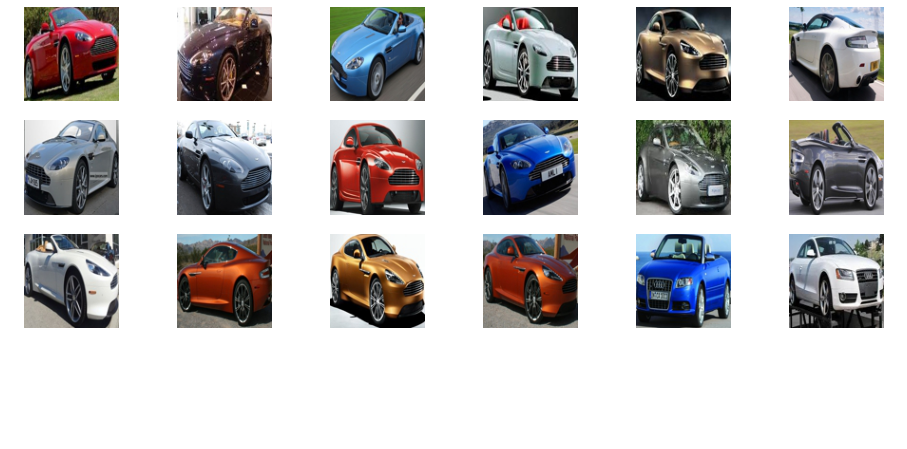

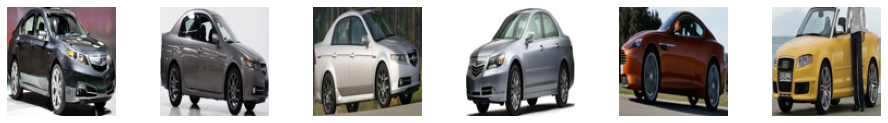

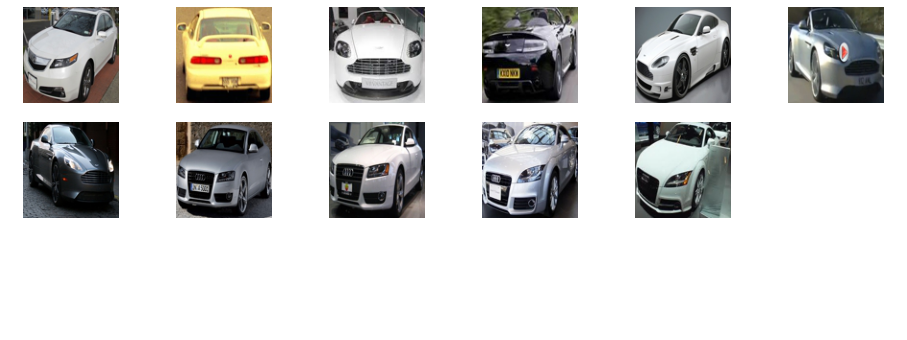

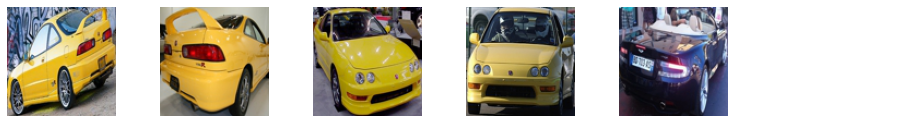

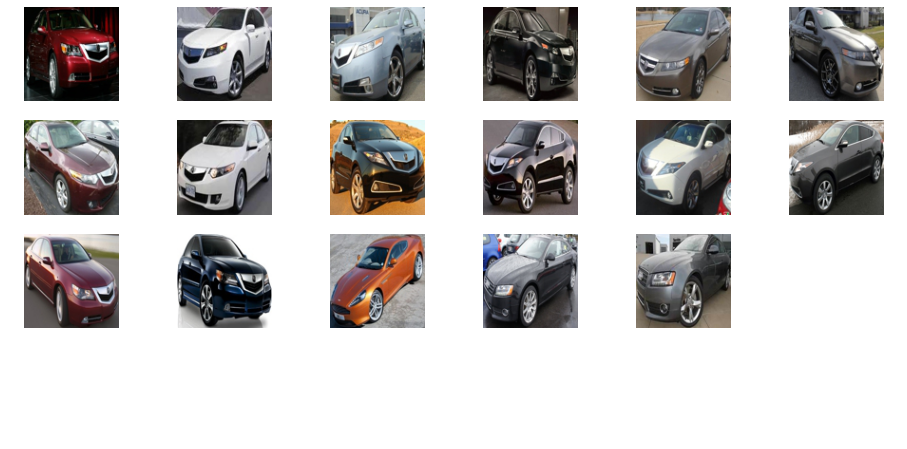

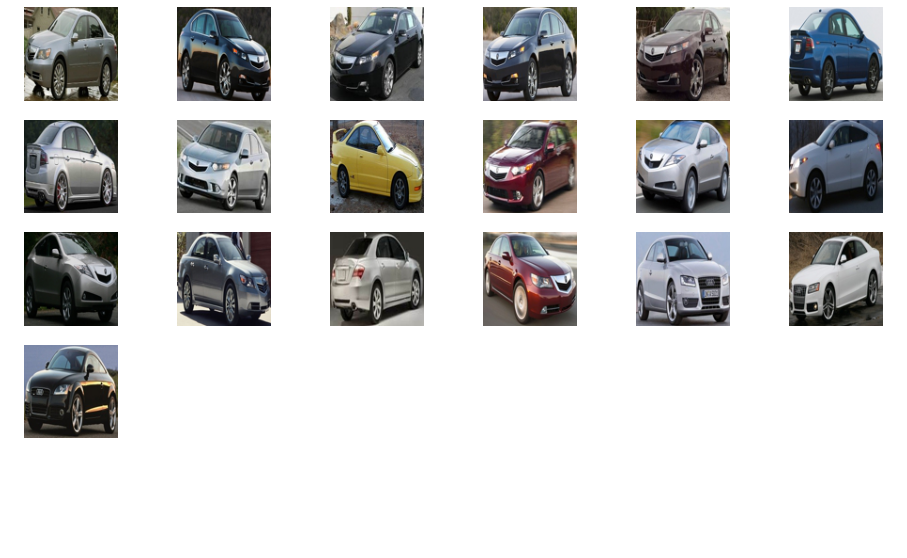

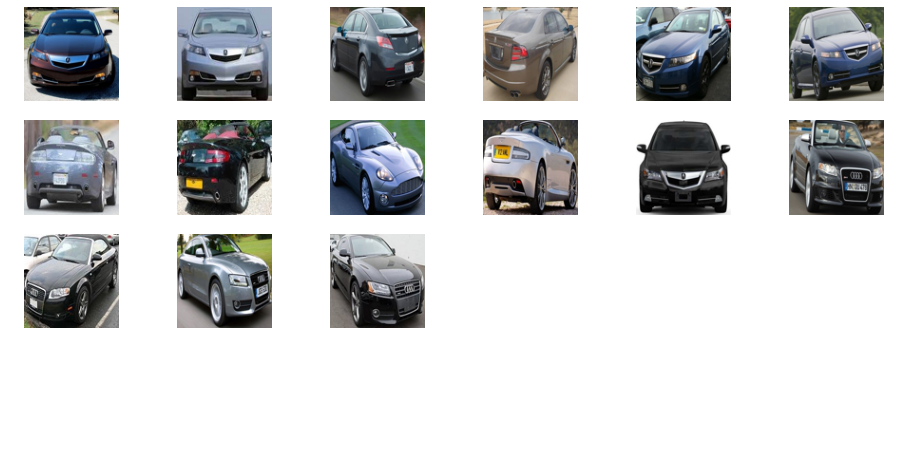

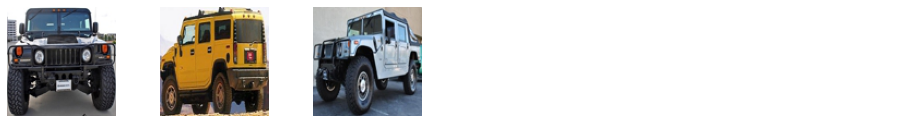

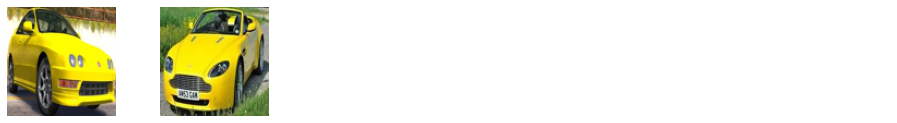

In [29]:
print('car com k=10')

k = 10

model_k_m = KMeans(n_clusters=k)
model_k_m.fit(df_train[100:200])

cluster0 = []
cluster1 = []
cluster2 = []
cluster3 = []
cluster4 = []
cluster5 = []
cluster6 = []
cluster7 = []
cluster8 = []
cluster9 = []

for idx, c in enumerate(model_k_m.labels_):
    if c == 0:
        cluster0.append(result.iloc[idx+100]['Path'])
    elif c == 1:
        cluster1.append(result.iloc[idx+100]['Path'])
    elif c == 2:
        cluster2.append(result.iloc[idx+100]['Path'])
    elif c == 3:
        cluster3.append(result.iloc[idx+100]['Path'])
    elif c == 4:
        cluster4.append(result.iloc[idx+100]['Path'])
    elif c == 5:
        cluster5.append(result.iloc[idx+100]['Path'])
    elif c == 6:
        cluster6.append(result.iloc[idx+100]['Path'])
    elif c == 7:
        cluster7.append(result.iloc[idx+100]['Path'])
    elif c == 8:
        cluster8.append(result.iloc[idx+100]['Path'])
    else:
        cluster9.append(result.iloc[idx+100]['Path'])
    
for cl in [cluster0, cluster1, cluster2, cluster3, cluster4, cluster5, cluster6, cluster7, cluster8, cluster9]:
    
    ncols = 6
    nrows = int((len(cl)+1)/(ncols-2))
    
    if nrows == 0:
        nrows = 1
    
    plt.rcParams['figure.figsize'] = (16, nrows*2)
    
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols)
    for i, path in enumerate(cl):
        image = Image.open(path)
        axes.ravel()[i].imshow(image)
    
    [ax.set_axis_off() for ax in axes.ravel()]
    
    
    
    plt.show()

In [30]:
# Analisando a classe car para k=10 é possível notar que desta vez os agrupamentos ocorreram em alguns casos conforme
# o modelo do carro, como no caso do jipe Hummer, e em outros casos também conforme a cor, como no último grupo.
# Ressalta-se, que, neste caso, quando rodado mais de uma vez, o algoritmo apresentou maior instabilidade, ou seja,
# caso rodado novamente tende a mudar os resultados.

### 2 - Hierarchical Agglomerative Clustering (HAC)

In [31]:
# Pedindo ao HAC para encontrar 8 clusters, mesmo número de classes ground truth, para cada método linkage
# e exibindo índices índices externos.
# O método Agglomerative Clustering do Scikit-learn permite escolher o número de clusters ou o limiar de distância de corte.

criterion = ['single', 'average', 'complete', 'ward']

print('Índices externos:')

for crit in criterion:
    model_hac = AgglomerativeClustering(n_clusters=8, compute_distances=True, linkage=crit)
    model_hac.fit(df_train)
    ars = adjusted_rand_score(model_hac.labels_, df_labels)
    comp = completeness_score(model_hac.labels_, df_labels)
    print('\nCritério:', crit)
    print(np.unique(model_hac.labels_, return_counts=True))
    print('Adjusted Rand Index: {:.4f}\nCompleteness Score: {:.4f}'.format(ars, comp))

Índices externos:

Critério: single
(array([0, 1, 2, 3, 4, 5, 6, 7], dtype=int64), array([793,   1,   1,   1,   1,   1,   1,   1], dtype=int64))
Adjusted Rand Index: 0.0000
Completeness Score: 0.0088

Critério: average
(array([0, 1, 2, 3, 4, 5, 6, 7], dtype=int64), array([  3, 782,   9,   2,   1,   1,   1,   1], dtype=int64))
Adjusted Rand Index: 0.0007
Completeness Score: 0.0230

Critério: complete
(array([0, 1, 2, 3, 4, 5, 6, 7], dtype=int64), array([184, 100,   5,  94, 200, 100,  63,  54], dtype=int64))
Adjusted Rand Index: 0.6825
Completeness Score: 0.8029

Critério: ward
(array([0, 1, 2, 3, 4, 5, 6, 7], dtype=int64), array([100, 100, 113,  87, 100, 100, 100, 100], dtype=int64))
Adjusted Rand Index: 0.9650
Completeness Score: 0.9758


Índice interno: Silhueta para o critério ward
Para n_clusters = 8 o Silhouette Score médio é: 0.18684836


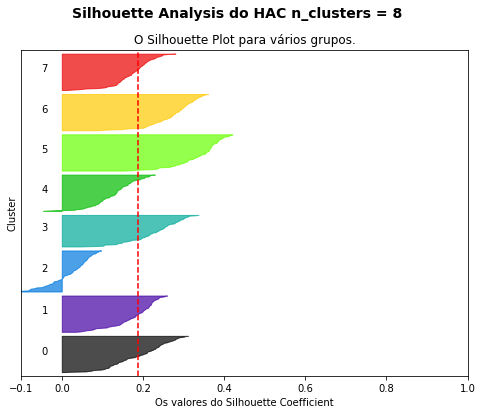

In [32]:
print('Índice interno: Silhueta para o critério ward')

plot_silhouette(df_train, model_hac, 'HAC')

In [33]:
# Da mesma maneira que foi visto com as features do VGG16, é possível notar que o critério single tem um desempenho
# bastante ruim, agregando as instâncias nos clusters completamente diferentes dos originais,
# inclusive deixando sete clusters com apenas uma instância.

# Por outro lado temos o critério ward, que procura minimizar a variância dos clusters criados, com um
# desempenho muito bom nos índices externos, mas desta vez apresenta um pouco piores em comparação com as features do VGG16.
# No que se refere ao índice interno da silhueta, o valor também fica abaixo daquele visto nas features do VGG16,
# o que é natural pois desta vez menos instâncias estão sendo classificadas corretamente, sendo estas instâncias alguns
# gatos que foram classificados como cachorros.

In [34]:
# Método de plotagem do dendrograma retirado e modificado da página do scikit-learn:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_agglomerative_dendrogram.html

def plot_dendrogram(model, **kwargs):
    plt.rcParams['figure.figsize'] = (12, 6)
    # Create linkage matrix and then plot the dendrogram
    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack([model.children_, model.distances_,
                                      counts]).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)
    plt.title('Hierarchical Clustering Dendrogram')
    plt.xlabel("Number of points in node (or index of point if no parenthesis).")
    _ = plt.show()

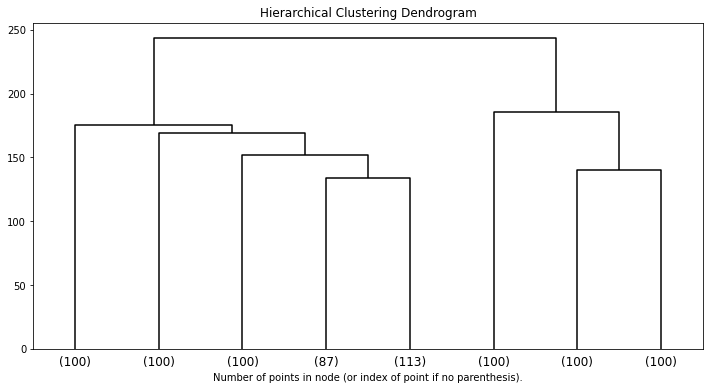

In [35]:
# Dendrograma mostrando o número de instâncias em cada cluster para o critério ward

plot_dendrogram(model_hac, truncate_mode='lastp', p=8, color_threshold=0, above_threshold_color='black')

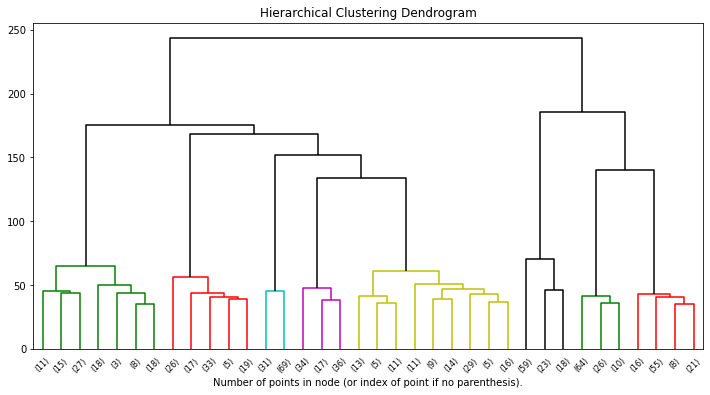

In [36]:
# Aumentando distância da truncagem para melhor visualizar clusters

plot_dendrogram(model_hac, truncate_mode='lastp', p=36, color_threshold=100, above_threshold_color='black')

In [37]:
a = 0
for cl in classes:
    print('\nClasse original:', cl)
    print(np.unique(model_hac.labels_[0+(a*100):100+(a*100)], return_counts=True))
    print(model_hac.labels_[0+(a*100):100+(a*100)])
    a += 1


Classe original: airplane
(array([0], dtype=int64), array([100], dtype=int64))
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

Classe original: car
(array([6], dtype=int64), array([100], dtype=int64))
[6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6
 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6
 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6]

Classe original: cat
(array([2, 3], dtype=int64), array([13, 87], dtype=int64))
[3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 2 3 3
 2 3 2 3 3 2 3 3 3 3 2 3 3 2 3 3 3 3 3 3 3 3 3 3 2 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 2 2 2 3 3 3 3 2 3 3 3 2 2]

Classe original: dog
(array([2], dtype=int64), array([100], dtype=int64))
[2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2

Gatos agrupados como cachorro:
natural_images_100\cat\cat_0362.jpg Cluster: 2


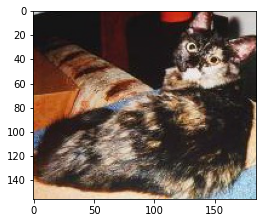

natural_images_100\cat\cat_0390.jpg Cluster: 2


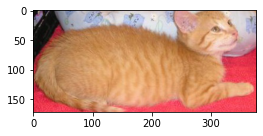

natural_images_100\cat\cat_0406.jpg Cluster: 2


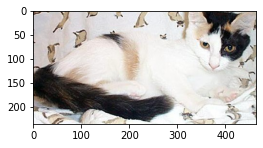

natural_images_100\cat\cat_0440.jpg Cluster: 2


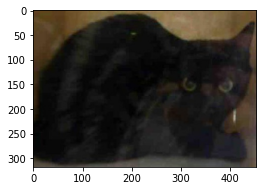

natural_images_100\cat\cat_0482.jpg Cluster: 2


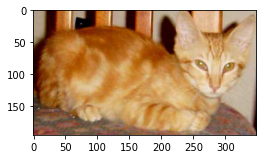

natural_images_100\cat\cat_0511.jpg Cluster: 2


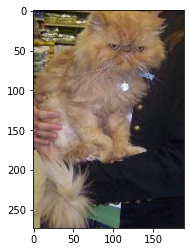

natural_images_100\cat\cat_0586.jpg Cluster: 2


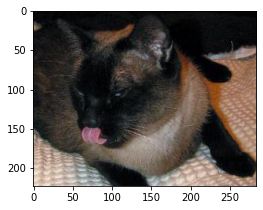

natural_images_100\cat\cat_0788.jpg Cluster: 2


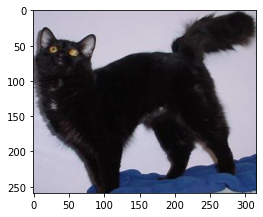

natural_images_100\cat\cat_0789.jpg Cluster: 2


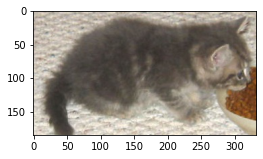

natural_images_100\cat\cat_0793.jpg Cluster: 2


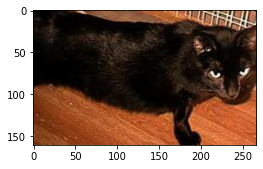

natural_images_100\cat\cat_0847.jpg Cluster: 2


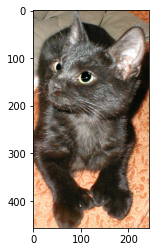

natural_images_100\cat\cat_0876.jpg Cluster: 2


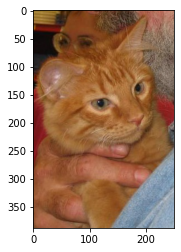

natural_images_100\cat\cat_0877.jpg Cluster: 2


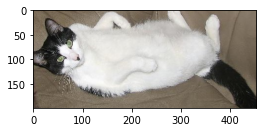

In [38]:
# Mostrando imagens dos objetos atribuídos a clusters que não correspondem a suas classes

plt.rcParams['figure.figsize'] = (4, 4)

print('Gatos agrupados como cachorro:')
for idx, c in enumerate(model_hac.labels_[200:300]):
    if c != 3:
        print(result.iloc[idx+200]['Path'], 'Cluster:', c)
        image = Image.open(result.iloc[idx+200]['Path'])
        fig, axes = plt.subplots()
        axes.imshow(image)
        plt.show()
        

Classe: airplane


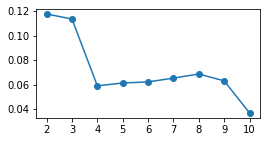

Classe: car


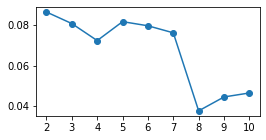

Classe: cat


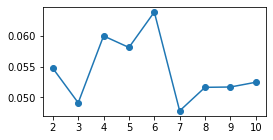

Classe: dog


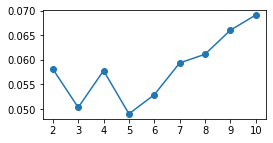

Classe: flower


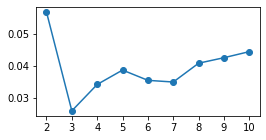

Classe: fruit


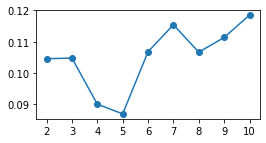

Classe: motorbike


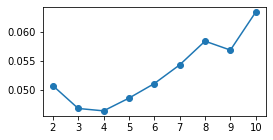

Classe: person


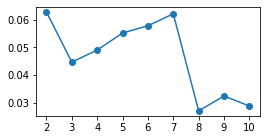

In [39]:
# Verificando para qual classe o algoritmo consegue formar o melhor conjunto de subgrupos baseado no método da silhueta
# e utilizando o critério ward

plt.rcParams['figure.figsize'] = (4, 2)

for i, cl in enumerate(classes) :
    
    print('Classe:', cl)
    clusters_range = range(2, int(np.sqrt(len(df_train[0+(i*100):100+(i*100)]))) + 1)
    silhouettes = []
    
    for k in clusters_range:

        model_hac = AgglomerativeClustering(n_clusters=k)
        model_hac.fit(df_train[0+(i*100):100+(i*100)])

        silhouettes.append(silhouette_score(df_train[0+(i*100):100+(i*100)], model_hac.labels_))
    
    plt.plot(clusters_range, silhouettes, '-o')
    plt.xticks(clusters_range)
    plt.show()

flower com n_clusters=2


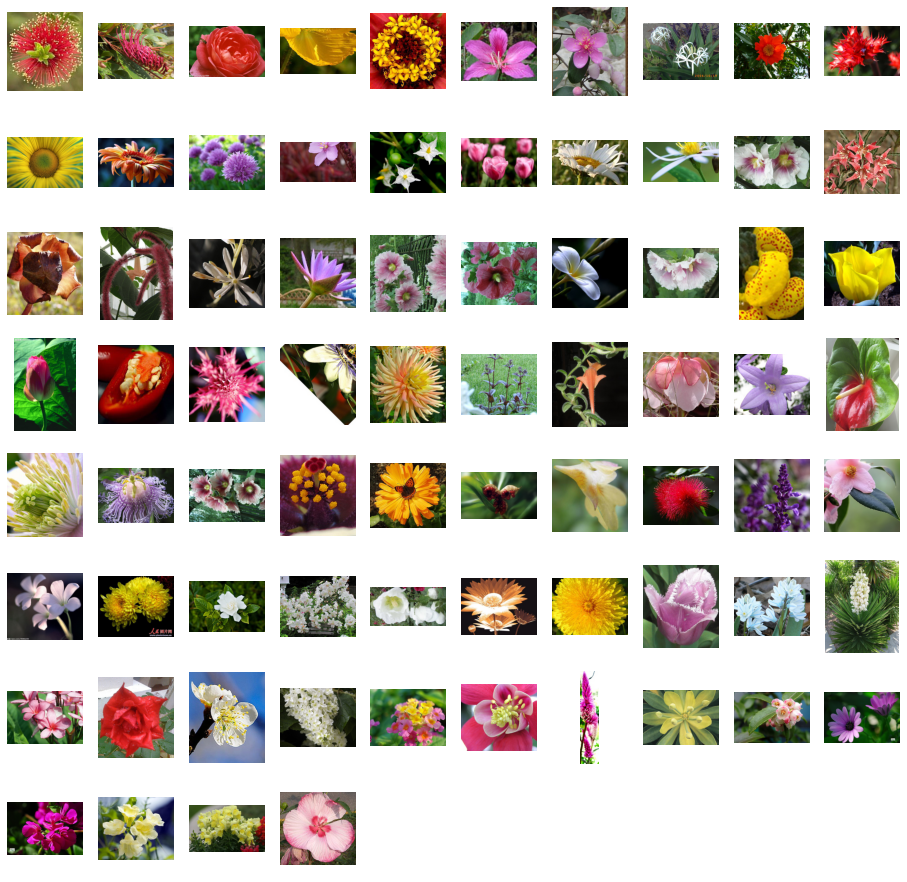

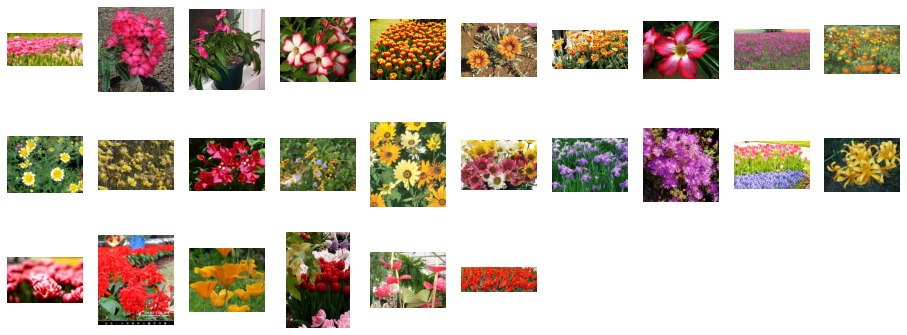

In [40]:
# Com a features da Resnet18, nota-se que na maior parte dos casos os gráficos de silhuetas médias para as classes ficaram
# semelhantes a aqueles vistos nas features VGG16, sendo airplane com n_clusters=2 e fruit com n_clusters=10 as que
# obtiveram os maiores valores. Entretanto, os gráficos para a as classes flower e person são os que mais
# ficaram diferentes, obtendo seus melhores valores agora com n_clusters=2 e n_clusters=7, respectivamente.
# Por isso, analisaremos estes casos.

print('flower com n_clusters=2')

n_clusters = 2

model_hac = AgglomerativeClustering(n_clusters=n_clusters)
model_hac.fit(df_train[400:500])

cluster0 = []
cluster1 = []

for idx, c in enumerate(model_hac.labels_):
    if c == 0:
        cluster0.append(result.iloc[idx+400]['Path'])
    else:
        cluster1.append(result.iloc[idx+400]['Path'])
        
for cl in [cluster0, cluster1]:
    
    ncols = 10
    nrows = int((len(cl)+1)/(ncols-1))
    
    plt.rcParams['figure.figsize'] = (16, nrows*2)
    
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols)
    for i, path in enumerate(cl):
        image = Image.open(path)
        axes.ravel()[i].imshow(image)
    
    [ax.set_axis_off() for ax in axes.ravel()]
    
    plt.show()

In [41]:
# Entre os dois clusters gerados para a classe flower, é possível notar que, em geral, no primeiro ficaram imagens de
# flores que aparecem individualmente ou em poucas quantidades, enquanto no segundo constam imagens de várias flores
# juntas.

person com n_clusters=7


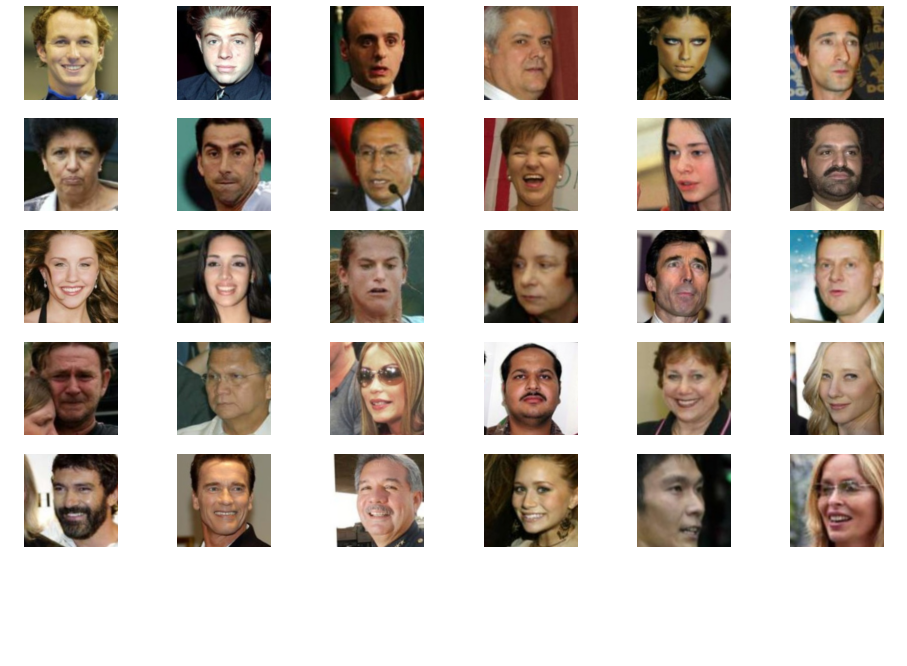

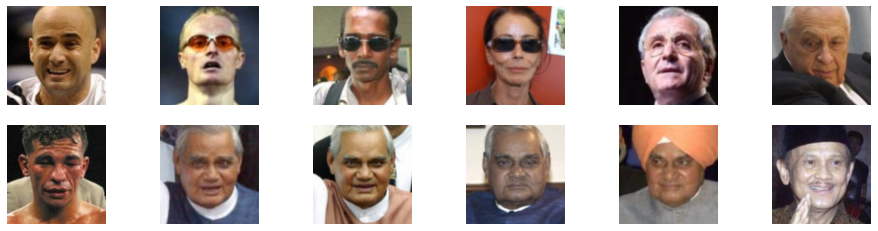

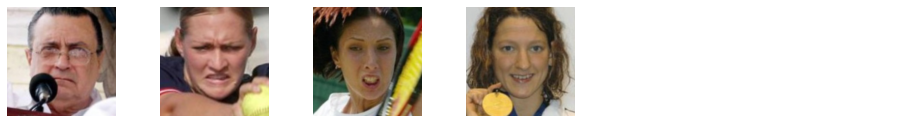

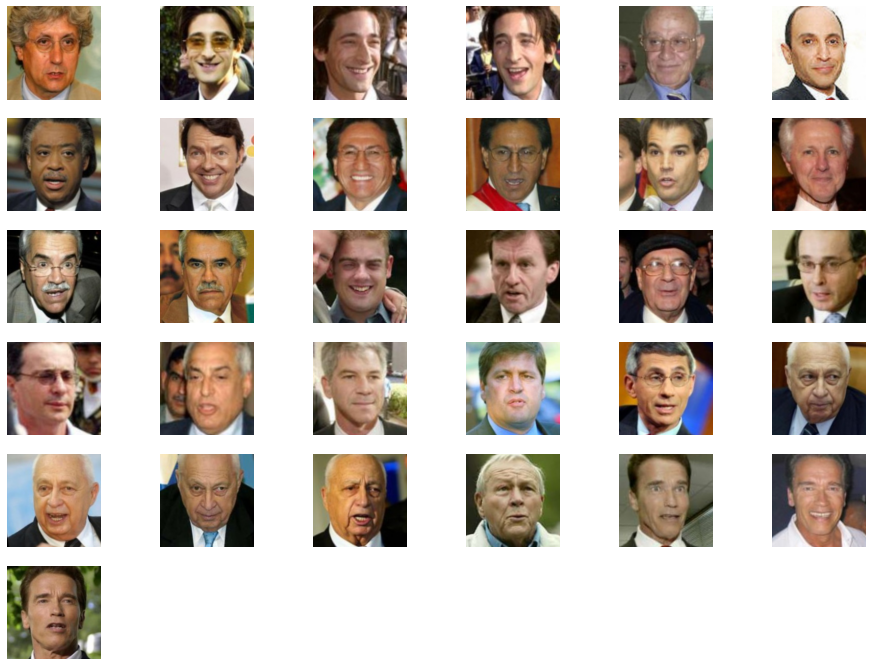

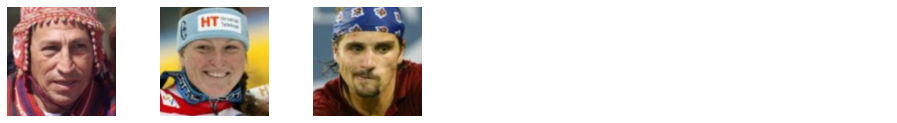

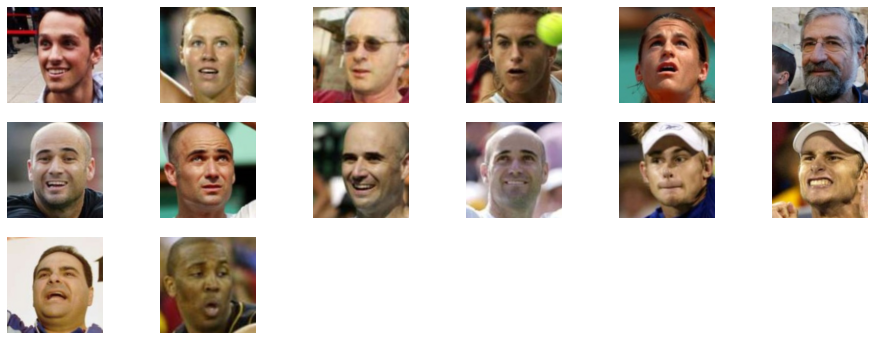

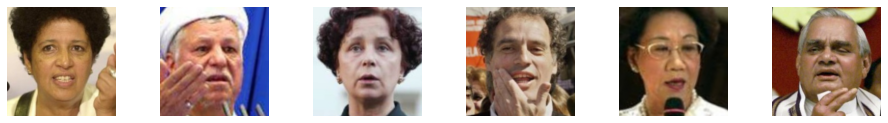

In [42]:
print('person com n_clusters=7')

n_clusters = 7

model_hac = AgglomerativeClustering(n_clusters=n_clusters)
model_hac.fit(df_train[700:800])

cluster0 = []
cluster1 = []
cluster2 = []
cluster3 = []
cluster4 = []
cluster5 = []
cluster6 = []

for idx, c in enumerate(model_hac.labels_):
    if c == 0:
        cluster0.append(result.iloc[idx+700]['Path'])
    elif c == 1:
        cluster1.append(result.iloc[idx+700]['Path'])
    elif c == 2:
        cluster2.append(result.iloc[idx+700]['Path'])
    elif c == 3:
        cluster3.append(result.iloc[idx+700]['Path'])
    elif c == 4:
        cluster4.append(result.iloc[idx+700]['Path'])
    elif c == 5:
        cluster5.append(result.iloc[idx+700]['Path'])
    else:
        cluster6.append(result.iloc[idx+700]['Path'])
    
for cl in [cluster0, cluster1, cluster2, cluster3, cluster4, cluster5, cluster6]:
    
    ncols = 6
    nrows = int((len(cl)+1)/(ncols-1))
    
    if nrows == 0:
        nrows = 1
    
    plt.rcParams['figure.figsize'] = (16, nrows*2)
    
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols)
    for i, path in enumerate(cl):
        image = Image.open(path)
        axes.ravel()[i].imshow(image)
    
    [ax.set_axis_off() for ax in axes.ravel()]
       
    plt.show()

In [43]:
# É possível notar que não há um padrão muito forte que diferencie os 10 clusters, mas é possível perceber algum deles
# como no caso do cluster com três imagens em que todas estão vestindo algo na cabeça, e no último cluster,
# em que os formatos dos cabelos são semelhantes em quatro das seis imagens.

## 3 - DBSCAN

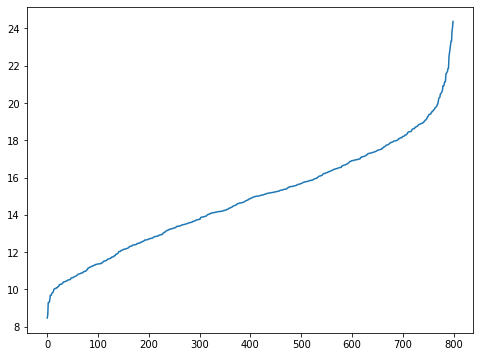

In [44]:
# Utilizando o K-dist plot para ter primeira base do valor de eps considerando n_neighbors=4

n_neighbors = 4
knn = NearestNeighbors(n_neighbors=n_neighbors)
neighbors = knn.fit(df_train)
distances, indices = neighbors.kneighbors(df_train)

distances = np.sort(distances, axis=0)
distances = distances[:, n_neighbors-1]

plt.rcParams['figure.figsize'] = (8, 6)
plt.plot(distances)

In [45]:
# Os valores de eps ideiais parecem ficar entre 14 e 22. Por isso, faremos um laço para tentar descobrir quais parâmentros
# do DBSCAN obtêm os melhores valores de adjusted rand index com um conjunto de 8 clusters, ou seja,
# os parâmetros que acertam mais instâncias e classes formando 8 clusters e 1 classe de outliers.

In [46]:
ars = 0

for i in np.arange(14, 22.5, 0.5):
    for j in range(2, 8, 1):
        model_dbs = DBSCAN(eps=i, min_samples=j)
        model_dbs.fit(df_train)
        ars1 = adjusted_rand_score(model_dbs.labels_, df_labels)
        if ars1 > ars and len(np.unique(model_dbs.labels_)) == 9:
            ars = ars1
            eps_ideal = i
            min_samples_ideal = j

print('Melhor Adjusted Rand Score foi de {} encontrado para eps = {} e min_samples = {}'
      .format(ars, eps_ideal, min_samples_ideal))

Melhor Adjusted Rand Score foi de 0.5990303215524836 encontrado para eps = 16.5 e min_samples = 7


In [47]:
model_dbs = DBSCAN(eps=16.5, min_samples=7)
model_dbs.fit(df_train)

ars = adjusted_rand_score(model_dbs.labels_, df_labels)
comp = completeness_score(model_dbs.labels_, df_labels)

print('Índices externos:\n\nAdjusted Rand Score: {}\nCompleteness Score: {}'.format(ars, comp))

Índices externos:

Adjusted Rand Score: 0.5990303215524836
Completeness Score: 0.7480727136885377


Índice interno: Silhueta média
Para n_clusters = 8 o Silhouette Score médio é: 0.13314351


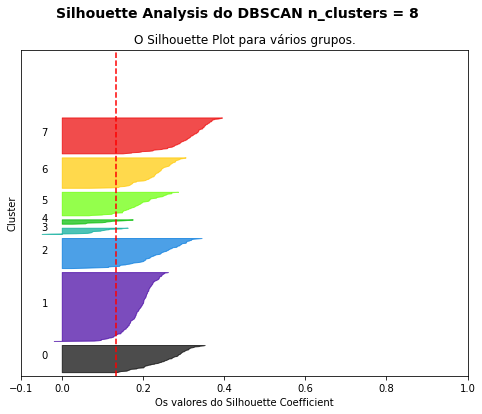

In [48]:
print('Índice interno: Silhueta média')

model_dbs.n_clusters = 8

plot_silhouette(df_train, model_dbs, 'DBSCAN')

In [49]:
print(np.unique(model_dbs.labels_, return_counts=True))

(array([-1,  0,  1,  2,  3,  4,  5,  6,  7], dtype=int64), array([174,  75, 189,  83,  18,  13,  65,  84,  99], dtype=int64))


In [50]:
# Analisando as instâncias das classes e a que cluster foram atribuídos

a = 0

for cl in classes:
    print('\nClasse original:', cl)
    print(np.unique(model_dbs.labels_[0+(a*100):100+(a*100)], return_counts=True))
    print(model_dbs.labels_[0+(a*100):100+(a*100)])
    a += 1


Classe original: airplane
(array([-1,  0], dtype=int64), array([25, 75], dtype=int64))
[ 0  0  0 -1  0 -1 -1  0 -1 -1  0 -1  0  0 -1  0  0 -1 -1  0  0 -1  0  0
 -1 -1 -1 -1 -1 -1 -1  0  0  0  0  0  0  0  0  0  0 -1 -1  0  0 -1  0  0
  0  0  0 -1  0  0  0  0  0  0  0  0  0  0  0  0 -1  0  0  0  0  0  0  0
  0  0  0  0 -1 -1  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0 -1]

Classe original: car
(array([-1,  1], dtype=int64), array([ 3, 97], dtype=int64))
[ 1  1  1  1  1  1  1  1  1  1  1  1  1  1 -1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1 -1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1 -1  1  1  1  1  1  1  1
  1  1  1  1]

Classe original: cat
(array([-1,  2], dtype=int64), array([17, 83], dtype=int64))
[ 2 -1  2  2  2 -1  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2
  2  2  2  2  2  2  2  2  2  2 -1  2  2 -1  2 -1  2  2 -1  2 

outliers


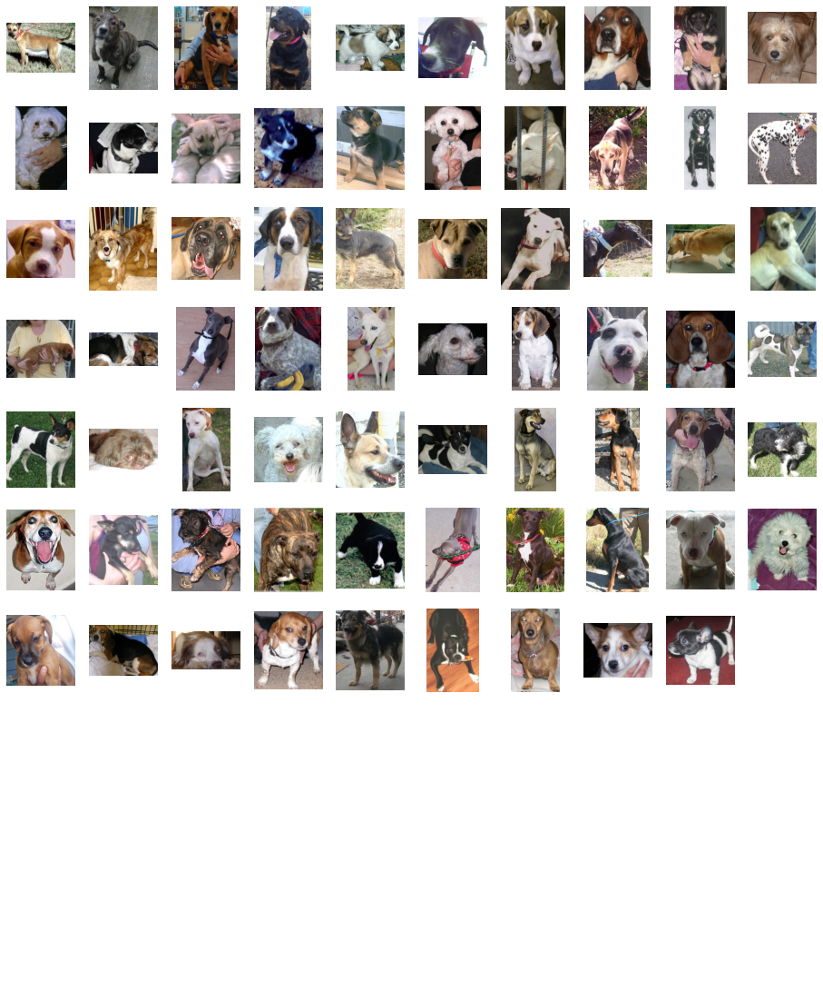

cluster 3


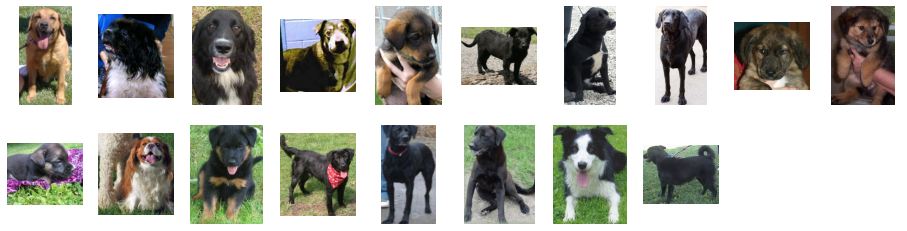

cluster 4


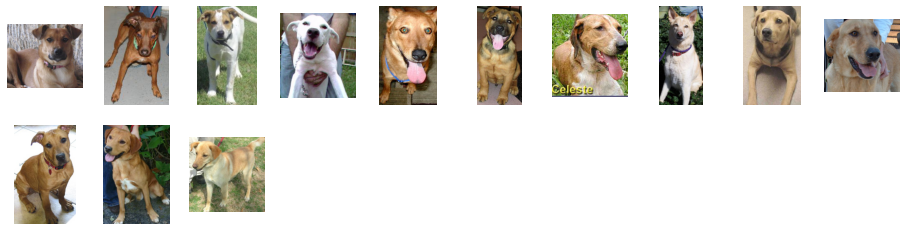

In [51]:
# Analisando e exibindo imagens dos clusters criados na classe dog

clustermenos1 = []
cluster3 = []
cluster4 = []

for idx, c in enumerate(model_dbs.labels_[300:400]):
    if c == -1:
        clustermenos1.append(result.iloc[idx+300]['Path'])
    elif c == 3:
        cluster3.append(result.iloc[idx+300]['Path'])
    else:
        cluster4.append(result.iloc[idx+300]['Path'])
        
for cl, n in zip([clustermenos1, cluster3, cluster4], ['outliers', 'cluster 3', 'cluster 4']):
    
    ncols = 10
    nrows = int((len(cl)+1)/(ncols-3))
    
    if nrows == 0:
        nrows = 1
    
    plt.rcParams['figure.figsize'] = (16, nrows*2)
    
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols)
    for i, path in enumerate(cl):
        image = Image.open(path)
        axes.ravel()[i].imshow(image)
    
    [ax.set_axis_off() for ax in axes.ravel()]
    
    print(n)
    plt.show()

In [52]:
# Novamente, assim como ocorrido nas features VGG16, é possível notar que o algoritmo DBSCAN, mesmo forçado a encontrar
# oito grupos, ainda assim não teve um bom desempenho, como é possível verificar pelos índices externos, em que
# se obteve 0.5990 no Adjusted Rand Score e 0.7480 no Completeness Score, e no índice interno Silhouette Score médio,
# em que se obteve 0.1331.

# Continua-se percebendo incapacidade de agrupar muitas imagens nos grupos corretos. Há 174 instâncias
# classificadas como outliers, além de o algoritmo ter juntado imagens de carros e motos em um único cluster
# e também ter criado dois clusters e um conjunto de outliers dentro da classe cachorro.

In [53]:
# Dentro de cada classe, procuraremos o conjunto de eps e min_samples que gera o maior silhouette score com um
# número mínimo de três clusters, uma vez que o DBSCAN tende a encadear bastante as instâncias e aparenta
# ter preferência por formar menos clusters, algo que foi notado quando testado este laço com um número
# mínimo de clusters = 3. Depois analisarmos os clusters criados para aquela classe.

a = 0

sil = -1

for cl in classes:
    
    for i in np.arange(2, 30, 1):
        for j in range(2, 8, 1):
            model_dbs = DBSCAN(eps=i, min_samples=j)
            model_dbs.fit(df_train[0+(a*100):100+(a*100)])
            if len(np.unique(model_dbs.labels_)) >= 4:
                sil1 = silhouette_score(df_train[0+(a*100):100+(a*100)], model_dbs.labels_)
                if sil1 > sil:
                    sil = sil1
                    eps_ideal = i
                    min_samples_ideal = j
                    classe1 = cl
                    n_clusters1 = len(np.unique(model_dbs.labels_))
                
    a += 1
    
print('Melhor Silhouette Score foi de {} encontrado para eps = {} e min_samples = {} na classe {}, com \
{} clusters gerados e mais um conjunto de outliers'.format(sil, eps_ideal, min_samples_ideal, classe1, n_clusters1-1))

Melhor Silhouette Score foi de 0.16353626549243927 encontrado para eps = 16 e min_samples = 2 na classe fruit, com 3 clusters gerados e mais um conjunto de outliers


In [54]:
model_dbs = DBSCAN(eps=16, min_samples=2)
model_dbs.fit(df_train[500:600])

silhouette_score(df_train[500:600], model_dbs.labels_)

0.16353627

In [55]:
np.unique(model_dbs.labels_, return_counts=True)

(array([-1,  0,  1,  2], dtype=int64), array([ 9, 86,  3,  2], dtype=int64))

clusters da classe fruit com a parametrização encontrada


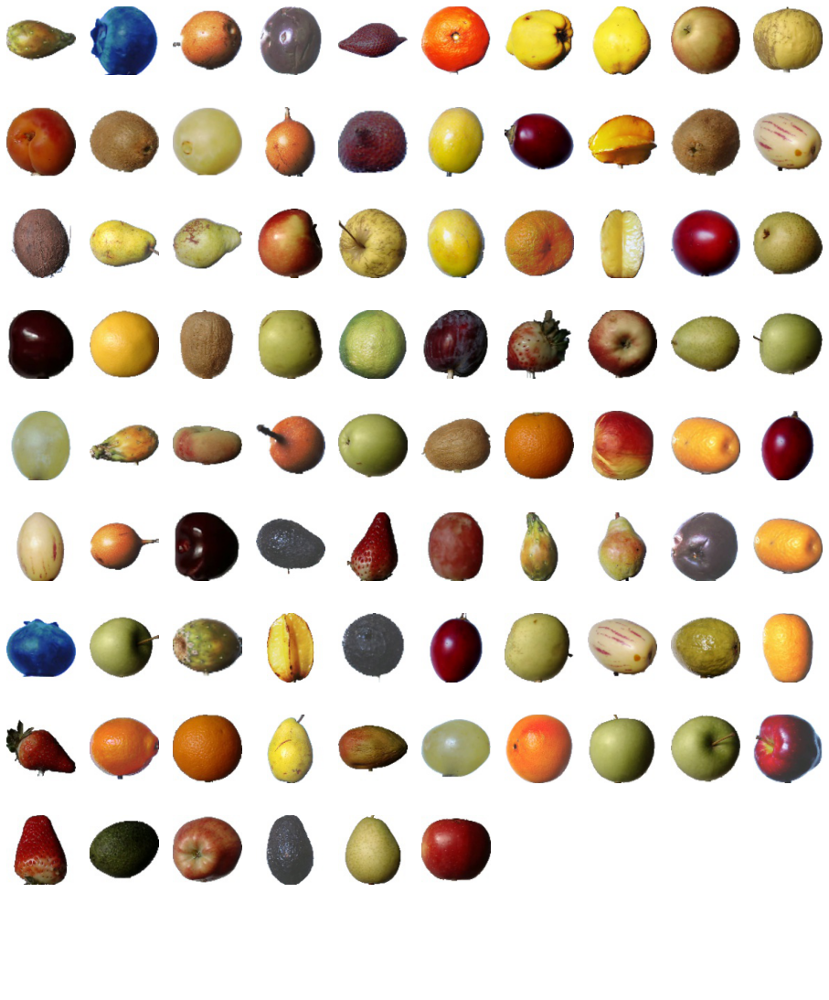

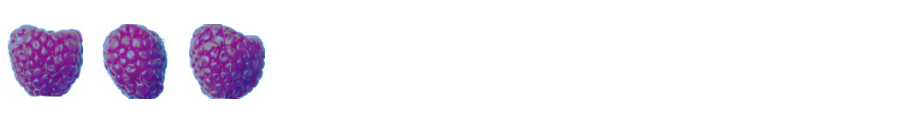

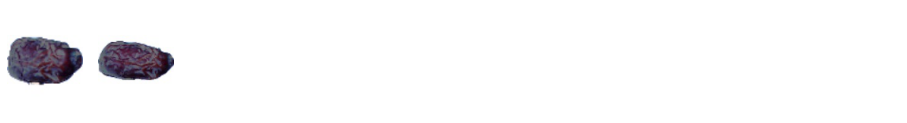

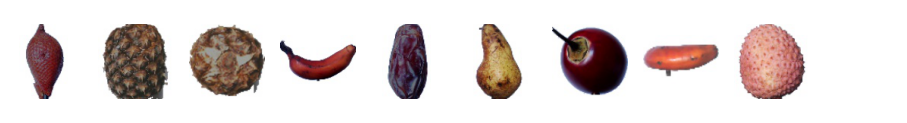

In [56]:
print('clusters da classe fruit com a parametrização encontrada')

n_clusters = 10

model_dbs = DBSCAN(eps=16, min_samples=2)
model_dbs.fit(df_train[500:600])

cluster0 = []
cluster1 = []
cluster2 = []
clustermenos1 = []

for idx, c in enumerate(model_dbs.labels_):
    if c == 0:
        cluster0.append(result.iloc[idx+500]['Path'])
    elif c == 1:
        cluster1.append(result.iloc[idx+500]['Path'])
    elif c == 2:
        cluster2.append(result.iloc[idx+500]['Path'])
    else:
        clustermenos1.append(result.iloc[idx+500]['Path'])
    
for cl in [cluster0, cluster1, cluster2, clustermenos1]:
    
    ncols = 10
    nrows = int((len(cl)+1)/(ncols-2))
    
    if nrows == 0:
        nrows = 1
    
    plt.rcParams['figure.figsize'] = (16, nrows*2)
    
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols)
    for i, path in enumerate(cl):
        image = Image.open(path)
        axes.ravel()[i].imshow(image)
    
    [ax.set_axis_off() for ax in axes.ravel()]
    
    plt.show()

In [57]:
# Novamente o melhor valor de silhueta foi encontrado dentro da classe fruit, assim como nas features VGG16. Entretanto,
# apesar de nesta vez o conjunto de outliers ser pequeno, o algoritmo criou um cluster muito grande com imagens de diversas
# frutas misturadas e outros dois clusters muito pequenos, com imagens de frutas iguais.

## PCA

In [58]:
# Aplicaremos redução de dimensionalidade com o método PCA, escolhendo o número de componentes com base na regra de Kaiser.
# Depois testaremos novamente os algoritmos com os melhores parâmetros encontrados anteriormente para analisar se ocorrem
# modificações nos resultados.

pca = PCA()
pca.fit(df_train)

print('Eigenvalues: ')
print(np.round(pca.explained_variance_, decimals=1))

print('Número de componentes pela regra de Kaiser: ', (np.round(pca.explained_variance_, decimals=1) >= 1).sum())

Eigenvalues: 
[40.5 23.8 21.8 19.1 17.3 13.4 11.2  5.3  4.3  4.   3.8  3.5  3.5  3.3
  3.   2.8  2.7  2.6  2.5  2.4  2.4  2.3  2.2  2.2  2.1  2.   2.   1.9
  1.8  1.7  1.7  1.7  1.6  1.6  1.6  1.5  1.4  1.4  1.4  1.4  1.4  1.3
  1.3  1.3  1.2  1.2  1.2  1.2  1.2  1.1  1.1  1.1  1.1  1.   1.   1.
  1.   1.   1.   0.9  0.9  0.9  0.9  0.9  0.9  0.9  0.9  0.8  0.8  0.8
  0.8  0.8  0.8  0.8  0.7  0.7  0.7  0.7  0.7  0.7  0.7  0.7  0.7  0.7
  0.7  0.6  0.6  0.6  0.6  0.6  0.6  0.6  0.6  0.6  0.6  0.6  0.5  0.5
  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5
  0.4  0.4  0.4  0.4  0.4  0.4  0.4  0.4  0.4  0.4  0.4  0.4  0.4  0.4
  0.4  0.4  0.4  0.4  0.3  0.3  0.3  0.3  0.3  0.3  0.3  0.3  0.3  0.3
  0.3  0.3  0.3  0.3  0.3  0.3  0.3  0.3  0.3  0.3  0.3  0.3  0.3  0.3
  0.3  0.3  0.3  0.3  0.3  0.3  0.2  0.2  0.2  0.2  0.2  0.2  0.2  0.2
  0.2  0.2  0.2  0.2  0.2  0.2  0.2  0.2  0.2  0.2  0.2  0.2  0.2  0.2
  0.2  0.2  0.2  0.2  0.2  0.2  0.2  0.2  0.2  0.2  0.2  0.2  0.

[]

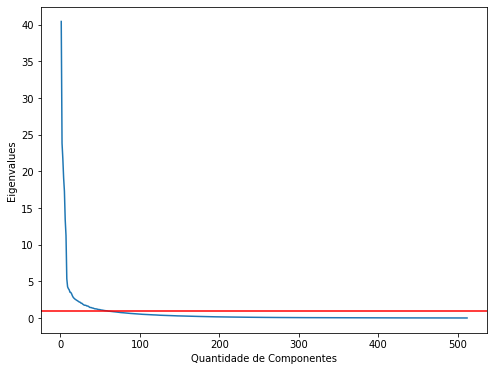

In [59]:
# Gráfico da regra de Kaiser
x = np.arange(pca.explained_variance_.shape[0]) + 1
y = pca.explained_variance_

plt.rcParams['figure.figsize'] = (8, 6)

plt.plot(x, y)
plt.axhline(1.0, color = 'red')
plt.xlabel('Quantidade de Componentes')
plt.ylabel('Eigenvalues')
plt.plot()

In [60]:
pca = PCA(n_components = 59)
pca.fit(df_train)

feat_pca = pca.transform(df_train)
pca.components_

array([[-0.00379736,  0.07999931,  0.03450701, ...,  0.0028086 ,
        -0.01401014,  0.00185153],
       [ 0.00409236, -0.05946432, -0.08433799, ..., -0.01349804,
         0.03218882,  0.03686239],
       [ 0.04871867,  0.00915779, -0.03128576, ..., -0.04914703,
        -0.03854654,  0.00127886],
       ...,
       [ 0.02143261,  0.06711897,  0.02061746, ..., -0.00845036,
         0.02101276, -0.02394975],
       [-0.01078017,  0.01233834, -0.05122584, ...,  0.00956512,
        -0.03397521, -0.03120739],
       [-0.02506067, -0.04455211, -0.0265795 , ..., -0.02732317,
        -0.06988843,  0.03296029]], dtype=float32)

In [61]:
colunasPCA = ['PCA_' + str(i) for i in range(1, 60)]

df_train_PCA = pd.DataFrame(data = feat_pca, columns = colunasPCA)

df_train_PCA.head()

,PCA_1,PCA_2,PCA_3,PCA_4,PCA_5,PCA_6,PCA_7,PCA_8,PCA_9,PCA_10,...,PCA_50,PCA_51,PCA_52,PCA_53,PCA_54,PCA_55,PCA_56,PCA_57,PCA_58,PCA_59
0,9.921618,14.173325,-4.029991,-2.025257,0.886555,-1.647710,1.844555,-2.541781,3.178391,2.749410,...,-0.175086,-1.708049,2.719141,-1.344346,-1.523985,1.387585,1.020134,-1.017262,-1.098372,0.102349
1,7.924913,12.021841,-4.390142,0.499175,0.438557,-0.810923,0.355543,-1.593752,1.675535,1.958362,...,0.517017,0.523930,0.424737,2.070081,-0.326746,-0.395665,-0.110564,-0.510044,-0.988366,0.225058
2,5.978255,5.955682,-2.111470,-0.830588,0.894518,-2.323377,-0.902020,-2.758012,1.345529,0.540661,...,-1.084927,1.545647,1.094719,1.499938,-0.718063,-1.722907,0.459022,0.857599,-1.115519,-0.532629
3,5.858091,5.606732,-1.560014,-1.097516,-0.719986,-1.301595,4.094959,-1.877506,4.136275,3.495957,...,-0.365159,0.626228,-1.696168,0.516658,1.458164,2.667511,-0.102467,-0.916951,0.435086,-0.138285
4,6.201717,6.929245,-1.646148,0.662426,-0.900510,-0.683663,-0.184124,-2.568368,3.223539,1.683302,...,1.807937,-0.043787,-0.864063,1.850316,-0.060731,-0.735513,-0.951996,-0.117017,0.040134,0.853193


In [62]:
# Fazendo o fit dos modelos agora no dataset reduzido com componentes PCA

model_k_m = KMeans(n_clusters=8)
model_k_m.fit(df_train_PCA)

model_hac = AgglomerativeClustering(n_clusters=8)
model_hac.fit(df_train_PCA)

model_dbs = DBSCAN(eps=16.5, min_samples=7)
model_dbs.fit(df_train_PCA)

DBSCAN(eps=16.5, min_samples=7)

In [63]:
# Verificando valores dos índices externos e interno

for model, nome in zip([model_k_m, model_hac, model_dbs], ['K-Means', 'HAC', 'DBSCAN']):
    print('\nÍndices com variáveis PCA no algortimo ', nome)
    print('Adjusted Rand Score: ', adjusted_rand_score(model.labels_, df_labels))
    print('Completeness Score: ', completeness_score(model.labels_, df_labels))
    print('Silhouette Score: ', silhouette_score(df_train_PCA, model.labels_))


Índices com variáveis PCA no algortimo  K-Means
Adjusted Rand Score:  0.9803643513333226
Completeness Score:  0.9827675354240176
Silhouette Score:  0.27842754

Índices com variáveis PCA no algortimo  HAC
Adjusted Rand Score:  0.9700767505163366
Completeness Score:  0.9784413356740089
Silhouette Score:  0.2769566

Índices com variáveis PCA no algortimo  DBSCAN
Adjusted Rand Score:  3.9867885670343776e-05
Completeness Score:  0.004257202675620145
Silhouette Score:  0.12750863


In [64]:
# Análise dos resultados dos índices com as variáveis PCA em comparação aos resultados obtidos nos dados originais

# K-Means (inicialização k-means++)
# Percebe-se que os índices externos diminuiram levemente, menos de 0.01, mas o índice interno da silhueta se melhorou,
# possivelmente pois agora existem menos features que tendem a representar uma menor distância no cálculo do indicador.

# HAC
# É possível notar que os índices externos melhoraram em cerca de 0.05, enquanto o índice externo da silhueta
# melhorou em cerca de 0.09, provavelmente pelo mesmo motivo descrito para o K-Means.

# DBSCAN
# Neste caso vemos que os indicadores externos pioraram completamente, o que era esperado, pois como agora se tratam
# de novas variáveis, seria necessário buscar novamente valores ideais de eps e min_samples. Para o índice interno
# da silhueta, por outro lado, não se viu grande piora.

# Logo, é possível perceber que o método de redução de dimensionalidade PCA foi satisfatório.

In [65]:
# Neste trabalho, pudemos observar diversas dificuldades inerentes à utilização de algoritmos de aprendizado não
# supervisionado. Estas dificuldades, na maior parte do tempo estão, aparentemente, na busca pelos melhores parâmetros
# dos modelos, algo que pode ser bastante complexo a depender dos dados com que se está trabalhando e também das
# características de cada algoritmo.

# Neste caso, em que tínhamos features de imagens, percebemos que os algoritmos K-Means e HAC se mostraram bastante
# eficientes, pois foi possível chegar a parâmetros que fizeram com que quase todas instâncias fossem classificadas
# corretamente, como bem pode ser visto por meio dos indicadores externos. Por outro lado, o algoritmo DBSCAN
# não se mostrou eficiente, possivelmente pois tem dificuldade para lidar com um espaço esparso com grandes números
# de features, de maneira que não consegue encontrar um cluster adequado para diversas instâncias e acaba por
# classificá-las como outliers.